#### In this notebook we will cluster Github users with K Means and use PCA & t-SNE models as visualization tools

In [1]:
import pandas as pd
import numpy as np

from pymongo import MongoClient
import os
import dotenv

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.offline as py

%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D

import warnings

/home/diego/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


### Mongo connection, extract and normalize

In [2]:
dotenv.load_dotenv()
MGURL = os.getenv("MGURL")
myclient = MongoClient(f"{MGURL}")
db = myclient.github

In [3]:
git = list(db.profiles.find({},{"_id":0, "company":0, "location":0, "email":0, "hireable":0}))

In [4]:
df = pd.json_normalize(git, "repos", ["name","repos_number","followers","created","updated"])

### Clean and prepare dataframe

In [5]:
print(df.shape)
df.head()

(1037132, 10)


,repo_name,forked,stars,language,forks,name,repos_number,followers,created,updated
0,AwesomeNER,False,6,Jupyter Notebook,2,Tarun Sudhams,23,33,2016-05-27T06:16:14Z,2020-05-05T07:34:00Z
1,coding-interview-university,True,2,None,1,Tarun Sudhams,23,33,2016-05-27T06:16:14Z,2020-05-05T07:34:00Z
2,COMP2396-assignments,False,0,Java,0,Tarun Sudhams,23,33,2016-05-27T06:16:14Z,2020-05-05T07:34:00Z
3,Computer-and-Communication-Networks,False,0,Python,1,Tarun Sudhams,23,33,2016-05-27T06:16:14Z,2020-05-05T07:34:00Z
4,Costa-Rican-Household-Poverty-Level-Prediction,False,0,HTML,4,Tarun Sudhams,23,33,2016-05-27T06:16:14Z,2020-05-05T07:34:00Z


In [6]:
df.created = df.created.str.replace(r"\b(?:(?!\d{4}-\d{2}).*)","")
df.updated = df.updated.str.replace(r"\b(?:(?!\d{4}-\d{2}).*)","")
df.drop(columns={"repo_name", "language"}, inplace=True)

In [7]:
df.isnull().sum()

forked              0
stars               0
forks               0
name            33898
repos_number        0
followers           0
created             0
updated             0
dtype: int64

In [8]:
df["years"] = df.updated.astype(int)-df.created.astype(int)
df.drop(columns={"created","updated"}, axis=1, inplace=True)
df.dropna(how="any", inplace=True)

In [9]:
print(df.shape)
df.isnull().sum()

(1003234, 7)


forked          0
stars           0
forks           0
name            0
repos_number    0
followers       0
years           0
dtype: int64

In [10]:
num = df.groupby(["name", "repos_number", "followers", "years"]).agg({"stars":"sum", "forks":"sum"}).reset_index()

In [11]:
num[num.name=="Tarun Sudhams"]

,name,repos_number,followers,years,stars,forks
33492,Tarun Sudhams,23,33,4,49,38


In [12]:
cat = df.groupby(["name","forked"]).size().unstack(fill_value=0).reset_index().rename(columns={"index":"name",False:"user_repo",True:"forked_repo"})

In [13]:
cat[cat.name=="Tarun Sudhams"]

forked,name,user_repo,forked_repo
32038,Tarun Sudhams,19,4


In [14]:
df = pd.merge(num, cat, on="name")

In [15]:
df[df.name=="Tarun Sudhams"]

,name,repos_number,followers,years,stars,forks,user_repo,forked_repo
33492,Tarun Sudhams,23,33,4,49,38,19,4


In [16]:
df.drop_duplicates(subset={"name"}, inplace=True)

### Descriptive Analysis

In [17]:
print(df.shape)
df.head()

(39730, 8)


,name,repos_number,followers,years,stars,forks,user_repo,forked_repo
0,Aníbal Catheringer,2,1,6,0,0,2,0
1,Cohen,18,2,3,0,2,18,0
2,Enrico Antonello,43,14,7,7,2,28,15
3,Jakub Smadiš,16,1,3,0,0,3,13
4,Marián Černý,16,3,8,22,6,3,13


In [18]:
df.describe()

,repos_number,followers,years,stars,forks,user_repo,forked_repo
count,39730.000000,39730.000000,39730.000000,39730.000000,39730.000000,39730.000000,39730.000000
mean,24.255525,24.255298,6.184797,77.669846,21.080191,12.482884,12.768412
std,106.191221,345.282214,2.895754,1015.294577,296.282536,50.270065,91.373219
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.000000,3.000000,4.000000,0.000000,0.000000,3.000000,1.000000
50%,12.000000,6.000000,6.000000,3.000000,1.000000,7.000000,4.000000
75%,27.000000,13.000000,8.000000,15.000000,6.000000,15.000000,11.000000
max,14637.000000,57545.000000,12.000000,123102.000000,34154.000000,9349.000000,14433.000000


#### As we see there really high max values compared to the means and medians, so we will show the users that can be considered outliers later below

In [19]:
X = df.drop(columns={"name"})

In [20]:
outliers = df[(X>1000).any(1)]
print(outliers.shape)
outliers.head()

(499, 8)


,name,repos_number,followers,years,stars,forks,user_repo,forked_repo
361,Adam Coddington,185,174,10,1975,434,120,65
421,Adam Mckaig,141,358,12,2029,461,82,59
467,Adam Zapletal,31,72,11,1987,376,10,21
1080,Alberto Paro,122,129,12,1108,401,30,92
1083,Alberto Pettarin,49,72,7,1071,271,29,20


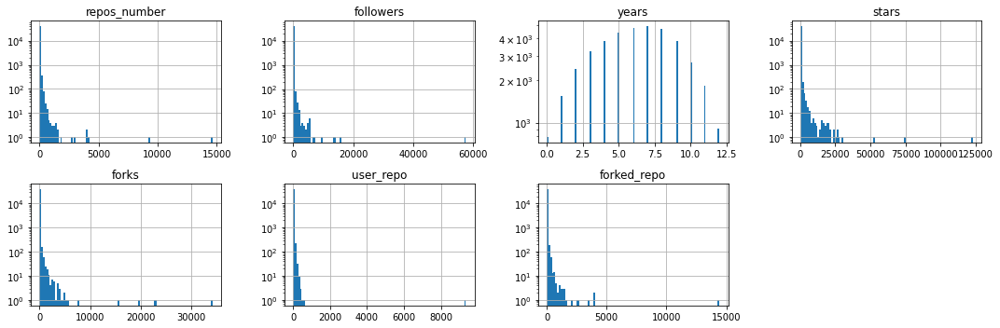

In [21]:
#we can see in all variables except for years and stars that the frequency of 0 es huge
figure = plt.figure(figsize=(15,5))

for n, c in enumerate(X.columns):
  ax = figure.add_subplot(2,4,n+1)
  ax.set_title(c)
  ax.set_yscale("log") #the log scale help us to have a better idea of our data when the distribution is not fair
  X[c].hist(ax=ax, bins=100)

figure.tight_layout() #this feature separate the graphs correctly
plt.show()

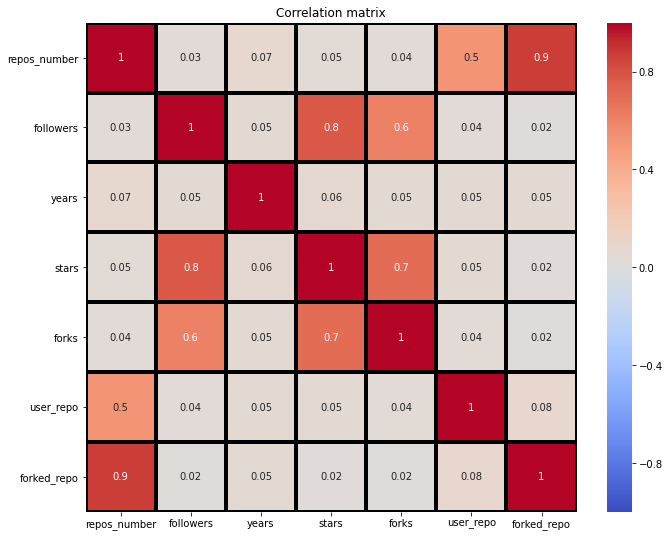

In [22]:
plt.figure(figsize=(11,9))

sns.heatmap(X.corr(), annot = True, fmt='.1g', vmin=-1, vmax=1, center= 0, cmap= 'coolwarm' , linewidths=3, linecolor='black')

plt.title('Correlation matrix')
plt.show()

#### There is a big positive linear relation between followers, stars and forks. However none of the repo columns  neither yeas are related with the 3 previous vars. Therefore we will take these 3 vars as the main characteristics to determine the seniority of users

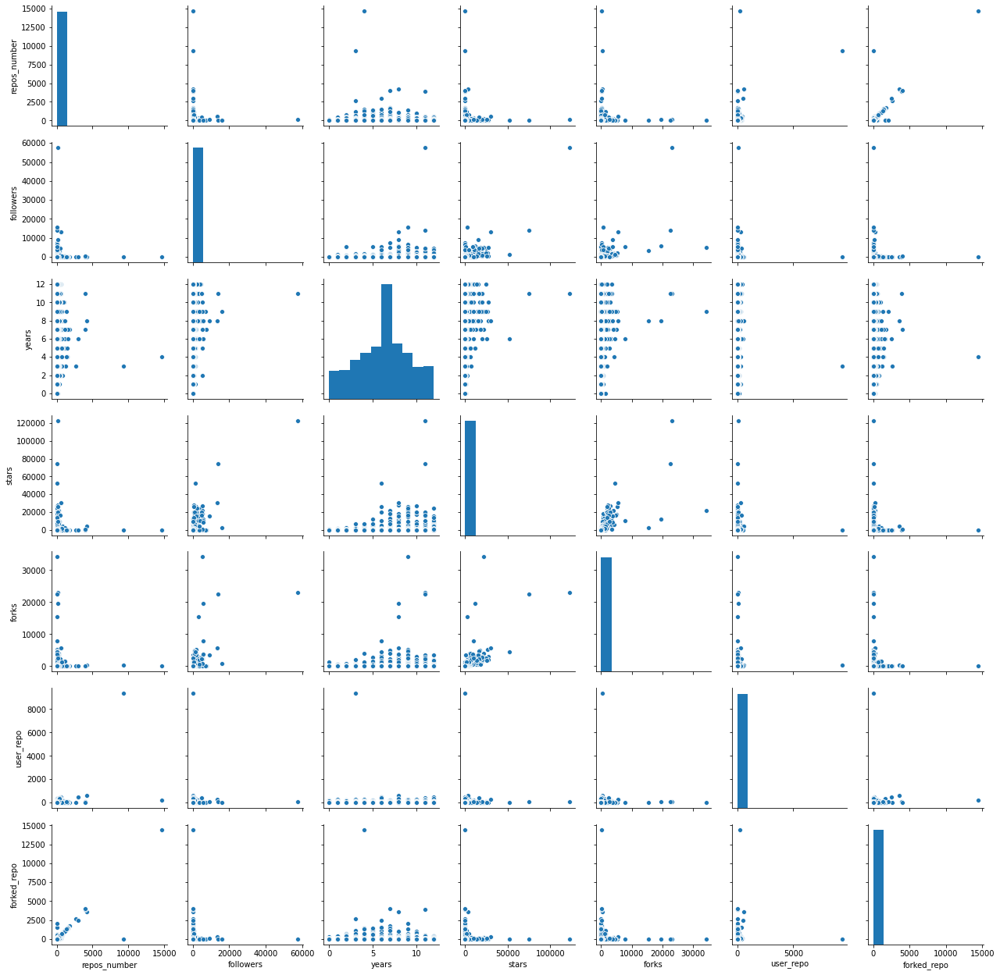

In [23]:
sns.pairplot(X)
plt.show()

#### Above we can see some valiables with really huge outliers that could affect our cluster model. Therefore we will eliminate them

In [24]:
df[(X>10000).any(1)]

,name,repos_number,followers,years,stars,forks,user_repo,forked_repo
1822,Alexander Lukyanchikov,22,762,7,17038,4981,6,16
2195,Allen Downey,105,5713,8,12031,19572,78,27
2518,Andrea Cardaci,32,420,8,11256,1029,27,5
2649,Andrea Mazzini,126,1183,9,19122,2196,31,95
3087,Andrew Carl,14637,27,4,48,39,204,14433
3242,Andrey Sitnik,60,4506,12,24147,1974,58,2
3878,Artur Arseniev,45,664,5,12172,2796,33,12
4938,Brad Larson,23,1928,9,26037,5292,17,6
5048,Brendan Gregg,42,4461,8,18460,2712,28,14
5137,Brian Caffo,57,3250,8,2481,15378,37,20


In [25]:
df.drop(df[(X>10000).any(1)].index, inplace=True)

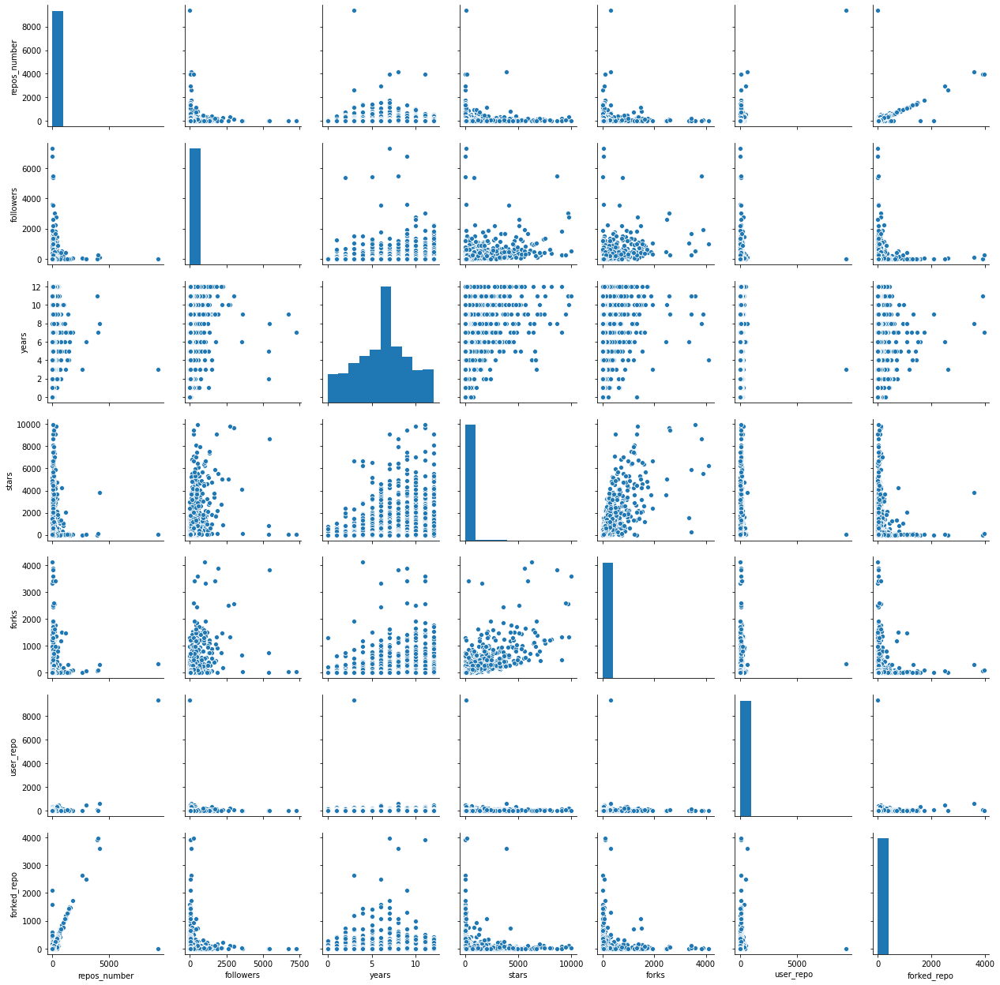

In [26]:
sns.pairplot(df)
plt.show()

#### Now almost all columns look good, but repos_number and followers still have some outliers over 5k, lets eliminate them too

In [27]:
df.drop(df[(X.repos_number>5000)|(X.followers>5000)].index, inplace=True)

/home/diego/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



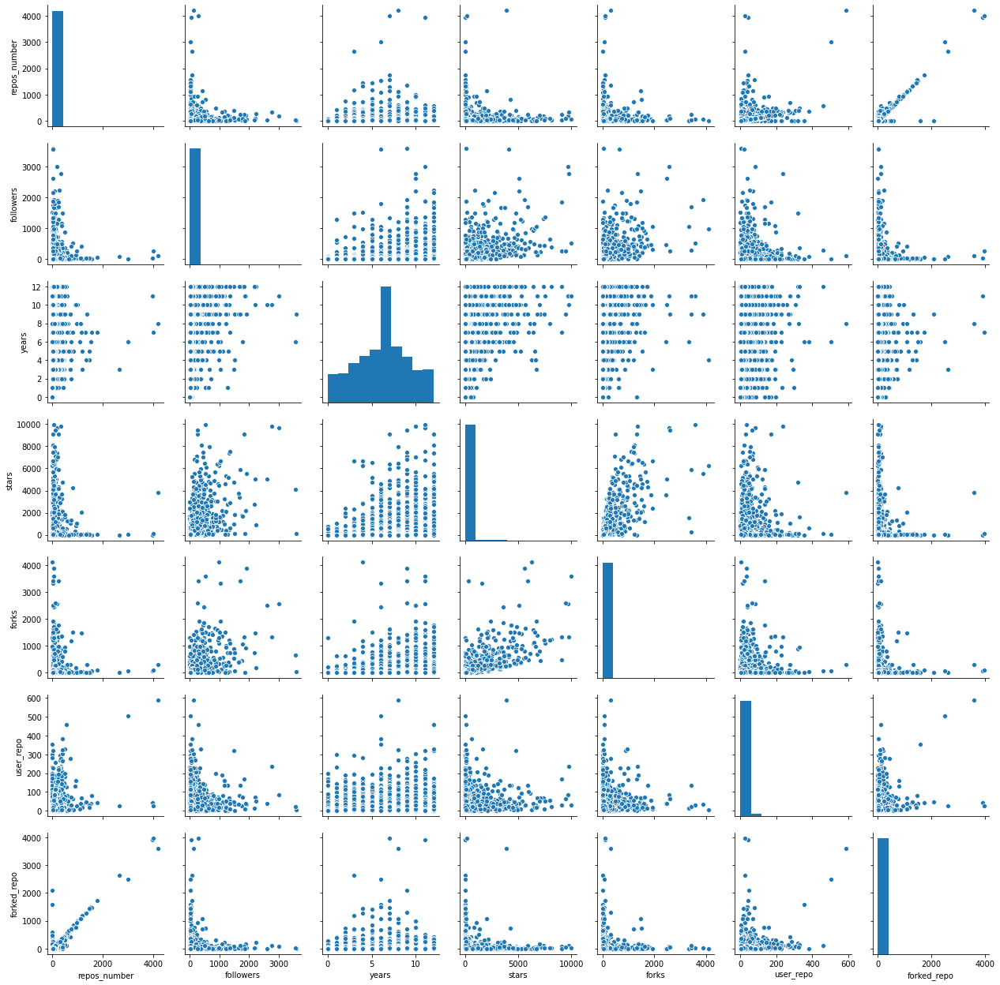

In [28]:
sns.pairplot(df)
plt.show()

In [29]:
df.describe()

,repos_number,followers,years,stars,forks,user_repo,forked_repo
count,39680.000000,39680.000000,39680.000000,39680.000000,39680.000000,39680.000000,39680.000000
mean,23.563432,18.566431,6.181956,53.681905,15.567061,12.189138,12.371321
std,60.793761,75.832125,2.895329,318.009316,86.771050,17.999690,55.802105
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.000000,3.000000,4.000000,0.000000,0.000000,3.000000,1.000000
50%,12.000000,6.000000,6.000000,3.000000,1.000000,7.000000,4.000000
75%,26.000000,13.000000,8.000000,14.000000,6.000000,15.000000,11.000000
max,4196.000000,3587.000000,12.000000,9979.000000,4111.000000,588.000000,3966.000000


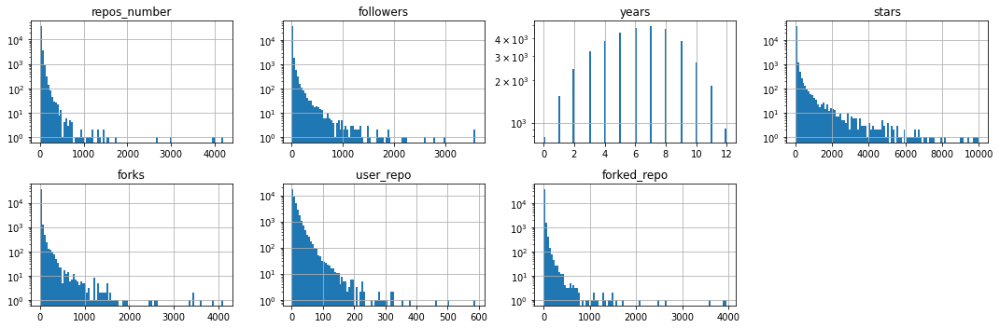

In [30]:
fig = plt.figure(figsize=(15,5))

for n, c in enumerate(df.drop(columns={"name"}).columns):
    ax = fig.add_subplot(2,4,n+1)
    ax.set_title(c)
    ax.set_yscale("log")
    df[c].hist(ax=ax, bins=100)

fig.tight_layout() #this feature separate the graphs correctly
plt.show()

#### Now the distribution of our sample looks fairer so we will proceed with the clustering with K Means

In [31]:
#we will exclude the name and the repos_number as we will use the user_repo and forked_repo for clustering
name = df.name
repos = df.repos_number
X = df.drop(columns={"name","repos_number"})

### Scale

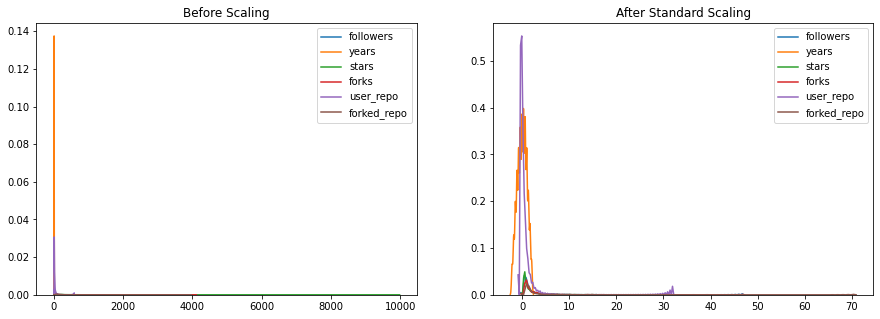

In [32]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

strans = scaler.fit_transform(X)

X_SS = pd.DataFrame(strans)
X_SS.columns = X.columns

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15, 5))
ax1.set_title('Before Scaling')
for e in X.columns:
    sns.kdeplot(X[e], ax=ax1, legend=True)
ax2.set_title('After Standard Scaling')
for e in X_SS.columns:
    sns.kdeplot(X_SS[e], ax=ax2, legend=True)
plt.show()

#### We show it again

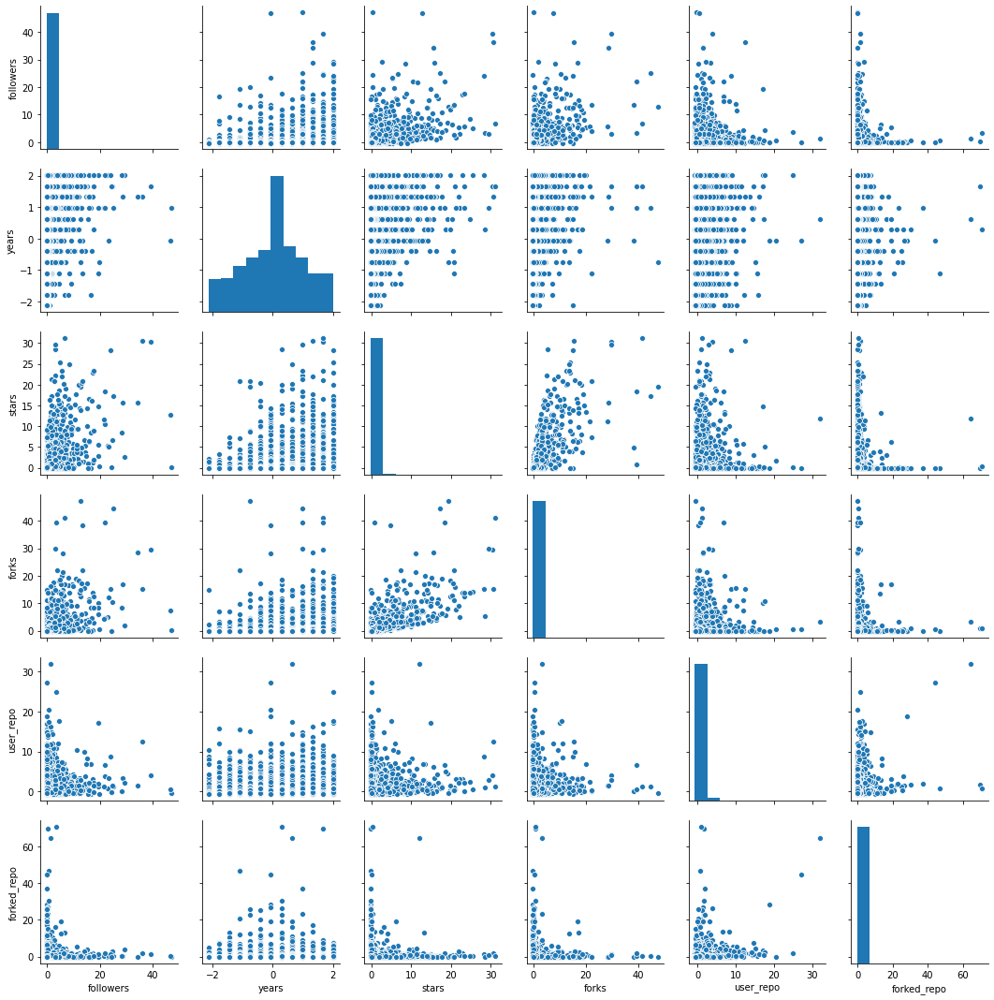

In [33]:
sns.pairplot(X_SS)
plt.show()

#### Now we can see the are just a few outliers, so it is time to apply K Means to identify the clusters of our dataset. We will use the Silhouette Score with the scaled and not scaled data to determine which to use finally and the number of clusters. The reason why we will check with both, scaled and not scaled data is because we have 1 variable, years, which have a different scale than the others, while the rest of variables have similar scale, so the need of scaling is not essential

### Silhouette Score -- Original Data

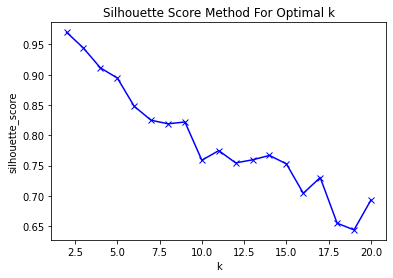

CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 4.77 µs


In [34]:
#we use the silhouette method to determine the ideal number of clusters. Although our clusters objective is 4-7
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

sil = []
kmax = 20
klusters = range(2, kmax+1)
# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in klusters:
    km = KMeans(n_clusters = k).fit(X)
    labels = km.labels_
    sil.append(silhouette_score(X, labels, metric = 'euclidean'))
    
plt.plot(klusters, sil, 'bx-')
plt.xlabel('k')
plt.ylabel('silhouette_score')
plt.title('Silhouette Score Method For Optimal k')
plt.show()
%time

### Silhouette Score -- Scaled Data

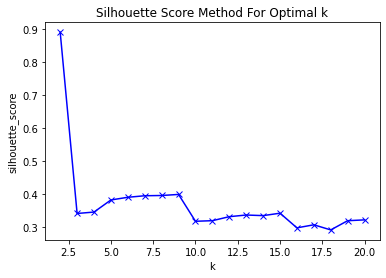

CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 5.01 µs


In [35]:
sil = []
kmax = 20
klusters = range(2, kmax+1)
# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in klusters:
    km = KMeans(n_clusters = k).fit(X_SS)
    labels = km.labels_
    sil.append(silhouette_score(X_SS, labels, metric = 'euclidean'))
    
plt.plot(klusters, sil, 'bx-')
plt.xlabel('k')
plt.ylabel('silhouette_score')
plt.title('Silhouette Score Method For Optimal k')
plt.show()
%time

- Standard Scaler --> Optimal Clusters 2, then between 7-10 with a score of 0.4
- Original Data --> Optimal Clusters 2, then decreases until 17


#### The optimal number of clusters is 2, but we want between 5-7 so we will use the original data and 5 clusters, as the score given is 0.9

In [36]:
model = KMeans(n_clusters=5)

labels = model.fit_predict(X)

X["label"] = labels

In [37]:
X_kmeans = X
print(X_kmeans.shape)
X_kmeans.head()

(39680, 7)


,followers,years,stars,forks,user_repo,forked_repo,label
0,1,6,0,0,2,0,0
1,2,3,0,2,18,0,0
2,14,7,7,2,28,15,0
3,1,3,0,0,3,13,0
4,3,8,22,6,3,13,0


In [38]:
lab = X_kmeans.label.value_counts()
lab

0    38367
3      973
2      228
1       84
4       28
Name: label, dtype: int64

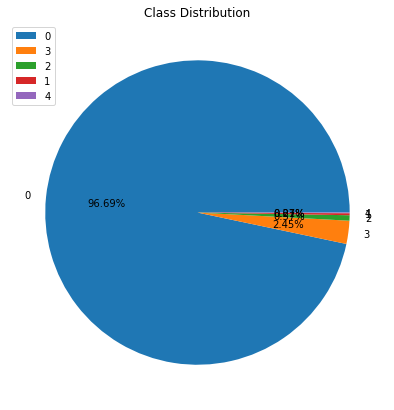

In [39]:
plt.figure(figsize=(15,7))
plt.pie(lab, labels=lab.keys(), autopct='%.2f%%')
plt.title("Class Distribution")
plt.legend(loc=2)
plt.show()

#### As we see the distribution of the labels is not really fair, so we will propabbly have to exclude more outliers again

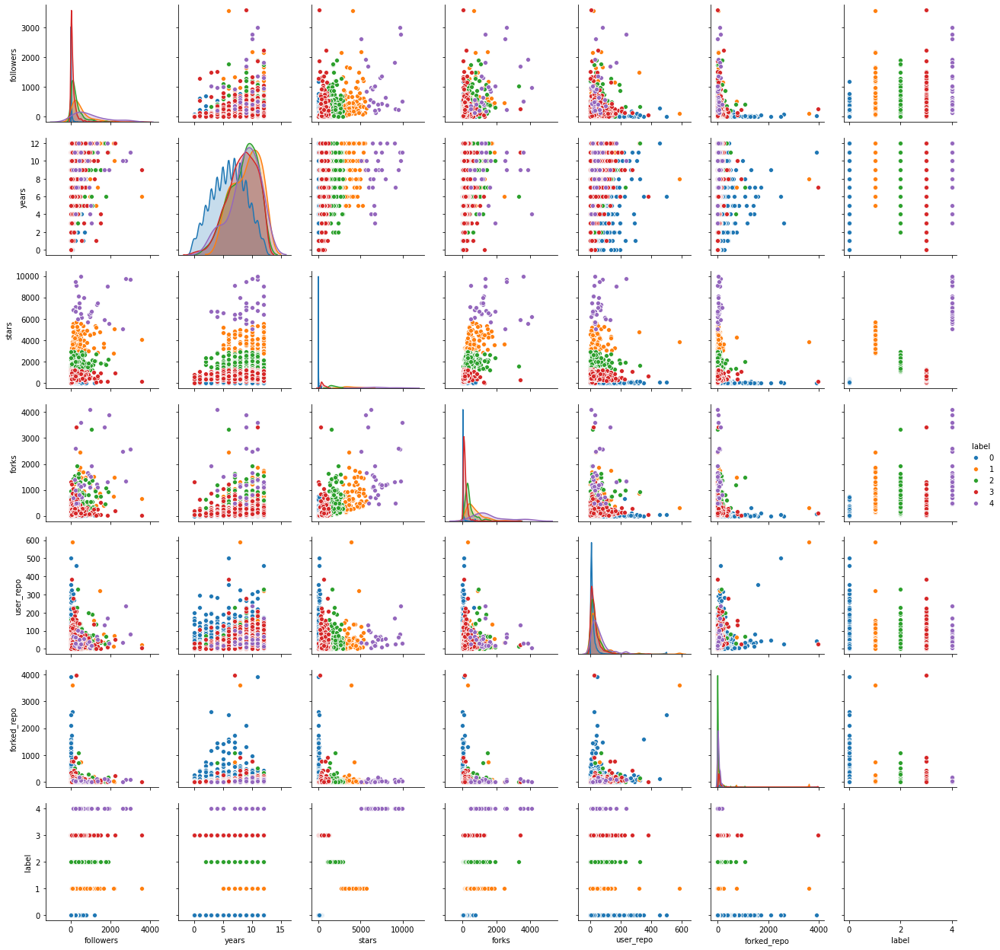

In [40]:
warnings.filterwarnings("ignore")

sns.pairplot(X_kmeans, hue="label")
plt.show()

### Conclusions from the graph:
- Labels: the unique variable that is clearly labeled is the stars
- Outliers: we still have outliers that make the label distribution really unfair
    - Forks: from 2.2k there are outliers
    - Followers: same problem 
    - Forked repos: from 2k on there are outliers
    - User repos: from 400

In [41]:
X_kmeans.describe()

,followers,years,stars,forks,user_repo,forked_repo,label
count,39680.000000,39680.000000,39680.000000,39680.000000,39680.000000,39680.000000,39680.000000
mean,18.566431,6.181956,53.681905,15.567061,12.189138,12.371321,0.089995
std,75.832125,2.895329,318.009316,86.771050,17.999690,55.802105,0.498988
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,4.000000,0.000000,0.000000,3.000000,1.000000,0.000000
50%,6.000000,6.000000,3.000000,1.000000,7.000000,4.000000,0.000000
75%,13.000000,8.000000,14.000000,6.000000,15.000000,11.000000,0.000000
max,3587.000000,12.000000,9979.000000,4111.000000,588.000000,3966.000000,4.000000


In [42]:
#this allows us to see all the columns
pd.set_option('display.max_columns', None)

X_kmeans.groupby("label").describe()

followers                                                         \
          count        mean         std    min     25%    50%      75%   
label                                                                    
0       38367.0   11.878020   26.144006    0.0    3.00    6.0    12.00   
1          84.0  540.178571  569.285859   57.0  163.75  369.5   674.75   
2         228.0  300.789474  323.957249    0.0   92.25  199.0   360.00   
3         973.0  143.449126  225.667284    0.0   40.00   79.0   162.00   
4          28.0  980.750000  814.241279  136.0  382.00  751.5  1328.25   

                 years                                                   \
          max    count      mean       std  min   25%   50%   75%   max   
label                                                                     
0      1194.0  38367.0  6.105325  2.877711  0.0  4.00   6.0   8.0  12.0   
1      3560.0     84.0  9.107143  2.297289  5.0  7.00  10.0  11.0  12.0   
2      1897.0    228.0  8.526316  2.426762  2.0  7.00   9.0  10.0  12.0   
3      3587.0    973.0  8.325797  2.504671  0.0  7.00   9.0  10.0  12.0   
4      3004.0     28.0  8.821429  2.524745  3.0  7.75   9.0  11.0  12.0   

         stars                                                              \
         count         mean          std     min      25%     50%      75%   
label                                                                        
0      38367.0    16.308729    38.471683     0.0     0.00     2.0    12.00   
1         84.0  3950.333333   787.660473  2746.0  3254.25  3746.5  4643.25   
2        228.0  1819.350877   444.750764  1093.0  1482.75  1743.5  2118.25   
3        973.0   570.189106   245.014288     2.0   375.00   503.0   728.00   
4         28.0  7248.107143  1394.535854  5045.0  6344.25  6791.5  7994.50   

                 forks                                                   \
          max    count         mean          std    min     25%     50%   
label                                                                     
0       321.0  38367.0     6.727709    19.629570    0.0     0.0     1.0   
1      5691.0     84.0   698.035714   453.591012  138.0   366.0   562.0   
2      2933.0    228.0   442.767544   377.570629   39.0   244.0   326.5   
3      1270.0    973.0   157.998972   165.393467    7.0    77.0   124.0   
4      9979.0     28.0  1652.142857  1044.844866  453.0  1073.0  1276.0   

                       user_repo                                          \
           75%     max     count       mean        std  min    25%   50%   
label                                                                      
0         5.00   745.0   38367.0  11.440874  16.235415  0.0   2.00   7.0   
1       900.75  2450.0      84.0  49.750000  75.632733  3.0  12.75  31.0   
2       484.75  3330.0     228.0  37.346491  40.932287  1.0  13.00  24.0   
3       195.00  3422.0     973.0  31.253854  33.949131  1.0  10.00  22.0   
4      2074.50  4111.0      28.0  57.464286  51.635820  4.0  25.75  38.0   

                    forked_repo                                           \
         75%    max       count       mean         std  min    25%   50%   
label                                                                      
0      14.00  503.0     38367.0  11.416269   47.754183  0.0   1.00   3.0   
1      53.25  588.0        84.0  87.107143  399.296339  0.0   9.75  20.0   
2      47.25  328.0       228.0  41.083333  101.852736  0.0   3.00  11.0   
3      39.00  382.0       973.0  35.973279  140.416273  0.0   5.00  16.0   
4      68.25  235.0        28.0  42.857143   43.119742  0.0  10.00  29.5   

                      
         75%     max  
label                 
0      10.00  3909.0  
1      44.25  3608.0  
2      39.50  1078.0  
3      36.00  3966.0  
4      58.75   175.0

#### If we compare both descriptive tables, we can see that the means, medians and std in the grouped table are still really high and broad respectively. So the best solution is to continue excluding outliers until the distribution and the statistic estimators are fairer. 1st we will start excluding the values said previously

In [43]:
X_kmeans.drop(X_kmeans[(X_kmeans.forks>2200)|(X_kmeans.followers>2200)|(X_kmeans.forked_repo>2000)|(X_kmeans.user_repo>400)].index, inplace=True)

In [44]:
X = X_kmeans.drop(columns={"label"})

model = KMeans(n_clusters=5)

labels = model.fit_predict(X)

X["label"] = labels

In [45]:
X_kmeans = X
print(X_kmeans.shape)
X_kmeans.head()

(39659, 7)


,followers,years,stars,forks,user_repo,forked_repo,label
0,1,6,0,0,2,0,0
1,2,3,0,2,18,0,0
2,14,7,7,2,28,15,0
3,1,3,0,0,3,13,0
4,3,8,22,6,3,13,0


In [46]:
lab = X_kmeans.label.value_counts()
lab

0    38238
4     1052
2      251
3       89
1       29
Name: label, dtype: int64

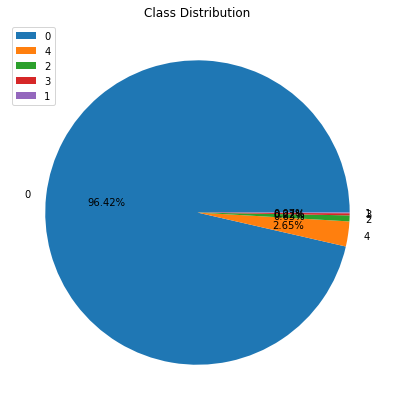

In [47]:
plt.figure(figsize=(15,7))
plt.pie(lab, labels=lab.keys(), autopct='%.2f%%')
plt.title("Class Distribution")
plt.legend(loc=2)
plt.show()

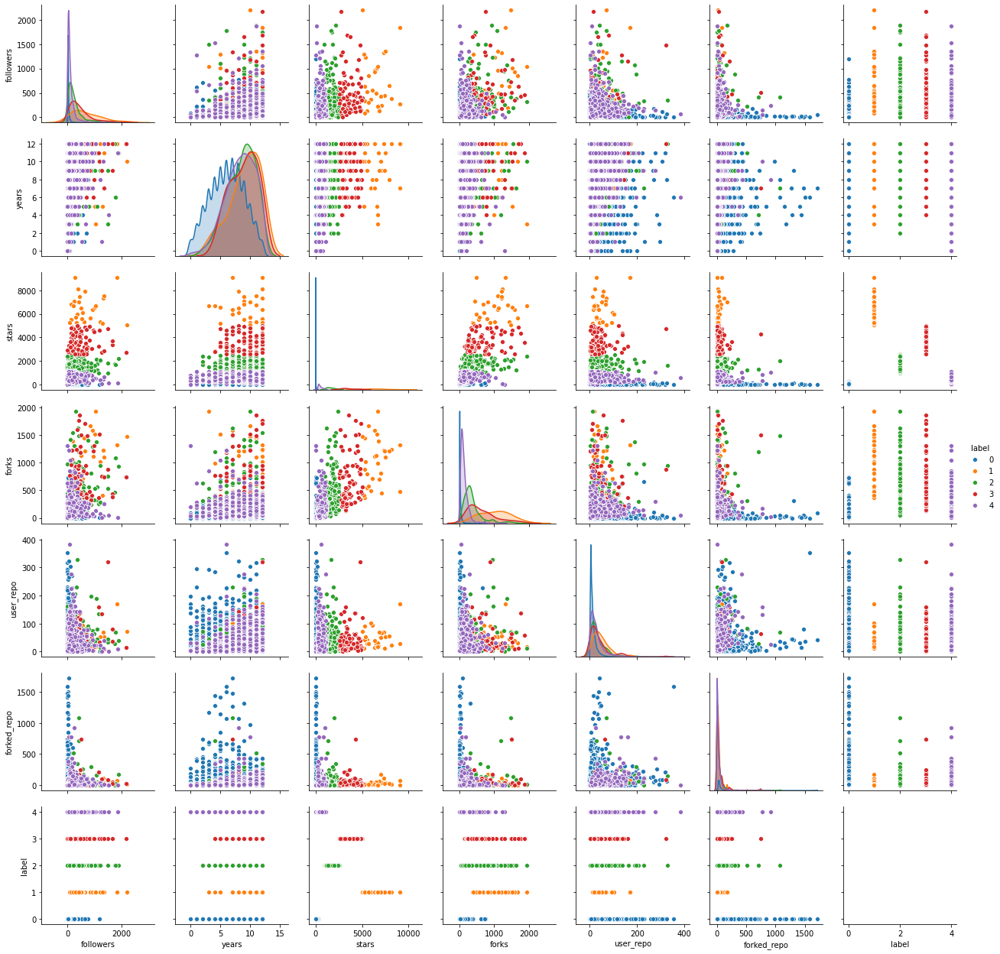

In [48]:
warnings.filterwarnings("ignore")

sns.pairplot(X_kmeans, hue="label")
plt.show()

In [49]:
X_kmeans.describe()

,followers,years,stars,forks,user_repo,forked_repo,label
count,39659.000000,39659.000000,39659.000000,39659.000000,39659.000000,39659.000000,39659.000000
mean,17.927885,6.180716,51.785169,14.700598,12.133438,11.887087,0.126226
std,64.622013,2.895014,295.532405,69.661146,17.398639,39.684718,0.674345
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,4.000000,0.000000,0.000000,3.000000,1.000000,0.000000
50%,6.000000,6.000000,3.000000,1.000000,7.000000,4.000000,0.000000
75%,13.000000,8.000000,14.000000,6.000000,15.000000,11.000000,0.000000
max,2198.000000,12.000000,9101.000000,1934.000000,382.000000,1720.000000,4.000000


In [50]:
#this allows us to see all the columns
pd.set_option('display.max_columns', None)

X_kmeans.groupby("label").describe()

followers                                                               \
          count        mean         std   min    25%    50%      75%     max   
label                                                                          
0       38238.0   11.647706   25.138836   0.0    3.0    6.0    12.00  1194.0   
1          29.0  704.413793  533.710028  81.0  298.0  527.0  1006.00  2198.0   
2         251.0  284.494024  316.392002   0.0   83.0  189.0   346.50  1897.0   
3          89.0  464.247191  409.987064   0.0  165.0  358.0   607.00  2168.0   
4        1052.0  125.915399  170.763633   0.0   38.0   72.0   144.25  1872.0   

         years                                                    stars  \
         count      mean       std  min  25%   50%   75%   max    count   
label                                                                     
0      38238.0  6.097495  2.875563  0.0  4.0   6.0   8.0  12.0  38238.0   
1         29.0  9.137931  2.587389  3.0  8.0  10.0  11.0  12.0     29.0   
2        251.0  8.501992  2.388932  2.0  7.0   9.0  10.0  12.0    251.0   
3         89.0  8.898876  2.301407  4.0  7.0   9.0  11.0  12.0     89.0   
4       1052.0  8.340304  2.522246  0.0  7.0   9.0  10.0  12.0   1052.0   

                                                                          \
              mean          std     min     25%     50%      75%     max   
label                                                                      
0        15.467702    35.546131     0.0     0.0     2.0    12.00   284.0   
1      6534.965517  1114.864581  5063.0  5556.0  6491.0  7102.00  9101.0   
2      1643.454183   409.185973   937.0  1291.5  1575.0  1957.50  2583.0   
3      3583.449438   719.340971  2602.0  3018.0  3363.0  4190.00  5017.0   
4       514.587452   223.648232     2.0   331.0   455.0   651.25  1121.0   

         forks                                                          \
         count         mean         std    min    25%     50%      75%   
label                                                                    
0      38238.0     6.480281   18.980142    0.0    0.0     1.0     5.00   
1         29.0  1026.275862  424.430534  372.0  694.0  1100.0  1320.00   
2        251.0   393.366534  301.304220   39.0  214.5   308.0   454.50   
3         89.0   650.471910  410.573825  138.0  343.0   536.0   836.00   
4       1052.0   141.472433  119.338010    7.0   71.0   113.5   177.25   

              user_repo                                                       \
          max     count       mean        std   min   25%   50%   75%    max   
label                                                                          
0       745.0   38238.0  11.355196  15.763530   0.0   2.0   7.0  14.0  353.0   
1      1934.0      29.0  48.241379  34.338291  11.0  27.0  41.0  66.0  170.0   
2      1932.0     251.0  37.952191  41.103938   1.0  13.0  25.0  48.5  328.0   
3      1864.0      89.0  40.561798  47.106252   2.0  12.0  24.0  50.0  320.0   
4      1307.0    1052.0  30.860266  33.559701   0.0  10.0  22.0  38.0  382.0   

      forked_repo                                                       
            count       mean        std  min   25%   50%   75%     max  
label                                                                   
0         38238.0  11.041843  37.761375  0.0   1.0   3.0  10.0  1720.0  
1            29.0  32.724138  37.880354  0.0  10.0  22.0  35.0   175.0  
2           251.0  41.131474  97.504557  0.0   4.0  13.0  43.0  1078.0  
3            89.0  43.932584  89.286286  0.0   7.0  20.0  45.0   744.0  
4          1052.0  32.346958  61.912620  0.0   5.0  16.0  37.0   921.0

#### We still have a bad distributed sample of labels and the statistic indicators are still high and broad, so we repeat the process again

In [51]:
X_kmeans.drop(X_kmeans[(X_kmeans.forks>1300)|(X_kmeans.followers>1000)|(X_kmeans.stars>5000)|(X_kmeans.forked_repo>700)|(X_kmeans.user_repo>250)].index, inplace=True)

In [52]:
X = X_kmeans.drop(columns={"label"})

model = KMeans(n_clusters=5)

labels = model.fit_predict(X)

X["label"] = labels

In [53]:
X_kmeans = X
print(X_kmeans.shape)
X_kmeans.head()

(39552, 7)


,followers,years,stars,forks,user_repo,forked_repo,label
0,1,6,0,0,2,0,0
1,2,3,0,2,18,0,0
2,14,7,7,2,28,15,0
3,1,3,0,0,3,13,0
4,3,8,22,6,3,13,0


In [54]:
lab = X_kmeans.label.value_counts()
lab

0    37156
4     1700
2      456
1      172
3       68
Name: label, dtype: int64

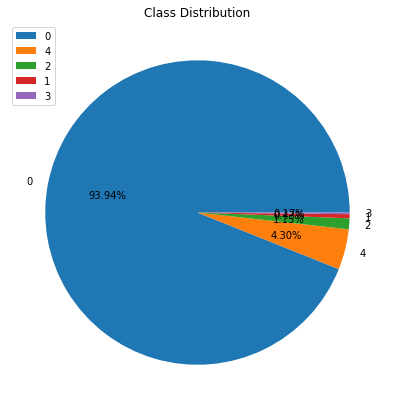

In [55]:
plt.figure(figsize=(15,7))
plt.pie(lab, labels=lab.keys(), autopct='%.2f%%')
plt.title("Class Distribution")
plt.legend(loc=2)
plt.show()

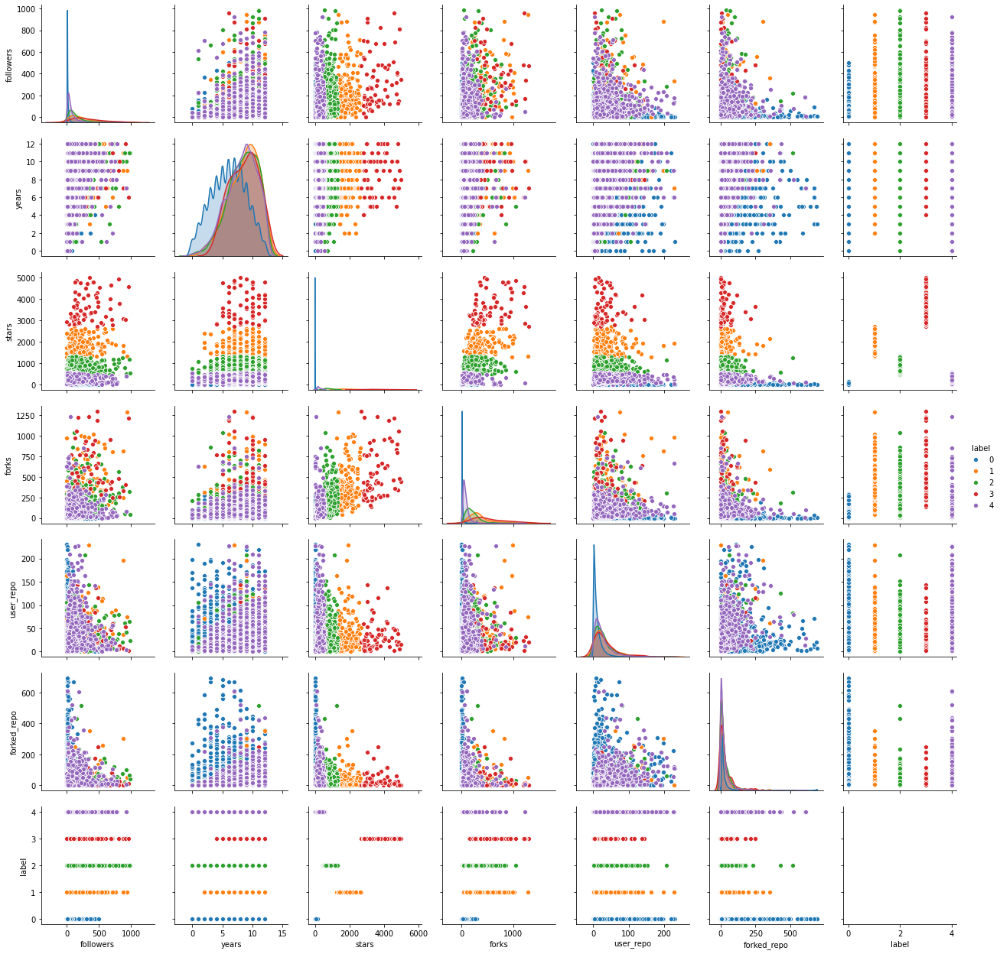

In [56]:
warnings.filterwarnings("ignore")

sns.pairplot(X_kmeans, hue="label")
plt.show()

In [57]:
X_kmeans.describe()

,followers,years,stars,forks,user_repo,forked_repo,label
count,39552.000000,39552.000000,39552.000000,39552.000000,39552.000000,39552.000000,39552.000000
mean,16.240367,6.174504,44.514867,12.927741,11.943492,11.158146,0.204490
std,46.122713,2.892333,219.760387,52.102531,16.254742,28.243872,0.843708
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,4.000000,0.000000,0.000000,3.000000,1.000000,0.000000
50%,6.000000,6.000000,3.000000,1.000000,7.000000,3.000000,0.000000
75%,13.000000,8.000000,14.000000,6.000000,15.000000,11.000000,0.000000
max,984.000000,12.000000,4999.000000,1300.000000,230.000000,693.000000,4.000000


In [58]:
#this allows us to see all the columns
pd.set_option('display.max_columns', None)

X_kmeans.groupby("label").describe()

followers                                                             \
          count        mean         std  min     25%    50%     75%    max   
label                                                                        
0       37156.0   10.021396   17.314683  0.0    2.00    6.0   11.00  499.0   
1         172.0  226.232558  190.234308  0.0   81.75  176.5  306.25  943.0   
2         456.0  163.142544  169.959632  0.0   54.00  108.0  203.75  984.0   
3          68.0  333.720588  236.894198  0.0  152.75  266.5  475.75  959.0   
4        1700.0   78.815294  101.587407  0.0   23.00   45.0   92.00  921.0   

         years                                                   stars  \
         count      mean       std  min  25%  50%   75%   max    count   
label                                                                    
0      37156.0  6.038863  2.863117  0.0  4.0  6.0   8.0  12.0  37156.0   
1        172.0  8.540698  2.443173  2.0  7.0  9.0  10.0  12.0    172.0   
2        456.0  8.412281  2.473815  0.0  7.0  9.0  10.0  12.0    456.0   
3         68.0  8.588235  2.293634  4.0  7.0  9.0  10.0  12.0     68.0   
4       1700.0  8.202941  2.522761  0.0  7.0  9.0  10.0  12.0   1700.0   

                                                                         \
              mean         std     min      25%     50%     75%     max   
label                                                                     
0        10.812386   21.299579     0.0     0.00     2.0    10.0   149.0   
1      1835.290698  363.631661  1278.0  1524.50  1757.0  2066.5  2704.0   
2       812.324561  211.460115   449.0   633.50   765.0   962.5  1323.0   
3      3608.367647  665.516204  2700.0  3050.75  3383.5  4097.0  4999.0   
4       251.440000  112.591254     0.0   163.75   222.5   318.0   560.0   

         forks                                                                \
         count        mean         std    min     25%    50%     75%     max   
label                                                                          
0      37156.0    4.762003   11.366689    0.0    0.00    1.0    4.00   292.0   
1        172.0  361.720930  223.682845   39.0  217.25  303.0  442.25  1288.0   
2        456.0  210.083333  141.677632    8.0  114.00  180.0  267.25  1040.0   
3         68.0  541.779412  305.576570  138.0  299.50  434.5  765.00  1300.0   
4       1700.0   82.074118   78.044579    1.0   40.00   63.5  100.00  1228.0   

      user_repo                                                       \
          count       mean        std  min   25%   50%    75%    max   
label                                                                  
0       37156.0  10.814108  14.218870  0.0   2.0   6.0  14.00  230.0   
1         172.0  36.395349  36.256164  1.0  14.0  24.5  46.25  229.0   
2         456.0  30.416667  28.497651  1.0  10.0  23.0  39.00  207.0   
3          68.0  32.632353  31.298231  2.0  11.0  23.0  47.00  143.0   
4        1700.0  28.371176  29.559457  0.0  10.0  20.0  36.00  228.0   

      forked_repo                                                      
            count       mean        std  min  25%   50%    75%    max  
label                                                                  
0         37156.0   9.929433  25.790233  0.0  1.0   3.0  10.00  693.0  
1           172.0  30.773256  51.764094  0.0  4.0  12.5  36.25  350.0  
2           456.0  29.500000  45.132674  0.0  4.0  16.0  38.50  516.0  
3            68.0  33.588235  48.783480  0.0  3.0  14.5  44.25  249.0  
4          1700.0  30.211765  50.691625  0.0  4.0  14.0  34.00  609.0

#### Again the distribution and statistic indicators are still too high and broad

In [59]:
X_kmeans.drop(X_kmeans[(X_kmeans.forks>442)|(X_kmeans.followers>475)|(X_kmeans.stars>900)].index, inplace=True)

In [60]:
X = X_kmeans.drop(columns={"label"})

model = KMeans(n_clusters=5)

labels = model.fit_predict(X)

X["label"] = labels

In [61]:
X_kmeans = X
print(X_kmeans.shape)
X_kmeans.head()

(39088, 7)


,followers,years,stars,forks,user_repo,forked_repo,label
0,1,6,0,0,2,0,1
1,2,3,0,2,18,0,1
2,14,7,7,2,28,15,1
3,1,3,0,0,3,13,1
4,3,8,22,6,3,13,1


In [62]:
lab = X_kmeans.label.value_counts()
lab

1    34556
0     3015
3      926
2      381
4      210
Name: label, dtype: int64

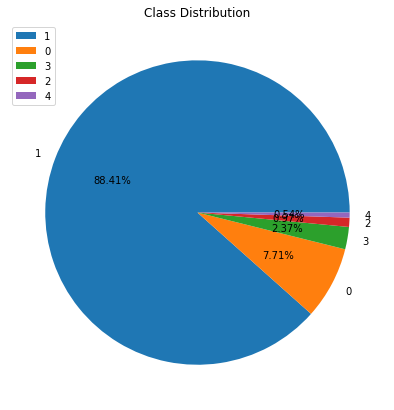

In [63]:
plt.figure(figsize=(15,7))
plt.pie(lab, labels=lab.keys(), autopct='%.2f%%')
plt.title("Class Distribution")
plt.legend(loc=2)
plt.show()

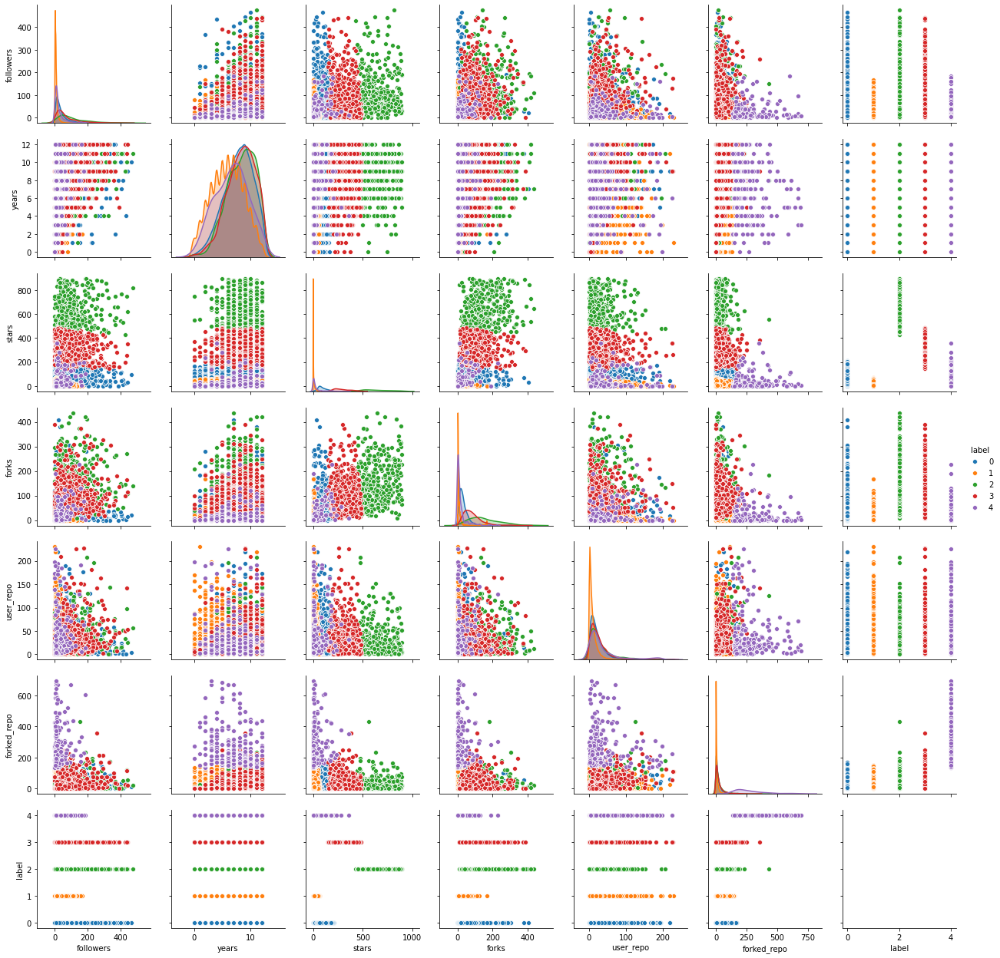

In [64]:
warnings.filterwarnings("ignore")

sns.pairplot(X_kmeans, hue="label")
plt.show()

In [65]:
X_kmeans.describe()

,followers,years,stars,forks,user_repo,forked_repo,label
count,39088.000000,39088.000000,39088.000000,39088.000000,39088.000000,39088.000000,39088.000000
mean,13.280598,6.147513,25.846833,8.980864,11.689649,10.923736,0.996111
std,27.937183,2.886071,80.693837,26.381253,15.783288,27.831596,0.479567
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,4.000000,0.000000,0.000000,3.000000,1.000000,1.000000
50%,6.000000,6.000000,2.000000,1.000000,7.000000,3.000000,1.000000
75%,12.000000,8.000000,13.000000,6.000000,15.000000,11.000000,1.000000
max,475.000000,12.000000,895.000000,437.000000,230.000000,693.000000,4.000000


In [66]:
#this allows us to see all the columns
pd.set_option('display.max_columns', None)

X_kmeans.groupby("label").describe()

followers                                                         \
          count        mean        std  min   25%   50%     75%    max   
label                                                                    
0        3015.0   43.363847  52.035208  0.0  13.0  27.0   51.00  465.0   
1       34556.0    7.939663  10.151318  0.0   2.0   5.0   10.00  168.0   
2         381.0  108.853018  92.351157  0.0  42.0  78.0  151.00  475.0   
3         926.0   72.349892  72.351534  0.0  24.0  46.0   95.00  442.0   
4         210.0   26.371429  33.934572  0.0   7.0  13.5   31.75  185.0   

         years                                                   stars  \
         count      mean       std  min  25%  50%   75%   max    count   
label                                                                    
0       3015.0  7.850083  2.549200  0.0  6.0  8.0  10.0  12.0   3015.0   
1      34556.0  5.914053  2.843442  0.0  4.0  6.0   8.0  12.0  34556.0   
2        381.0  8.338583  2.477968  0.0  7.0  9.0  10.0  12.0    381.0   
3        926.0  8.295896  2.494301  0.0  7.0  9.0  10.0  12.0    926.0   
4        210.0  6.671429  2.877340  0.0  4.0  7.0   9.0  12.0    210.0   

                                                                     forks  \
             mean         std    min    25%    50%     75%    max    count   
label                                                                        
0       91.703483   42.183546    0.0   61.0   84.0  119.00  208.0   3015.0   
1        6.219557   10.350966    0.0    0.0    2.0    7.00   67.0  34556.0   
2      635.351706  124.904752  426.0  530.0  611.0  730.00  895.0    381.0   
3      291.526998   77.656435  147.0  228.0  277.0  349.75  483.0    926.0   
4       32.709524   55.409190    0.0    3.0   11.0   31.00  355.0    210.0   

                                                              user_repo  \
             mean        std  min   25%    50%     75%    max     count   
label                                                                     
0       36.068657  33.212706  0.0  16.0   28.0   46.00  408.0    3015.0   
1        2.922213   6.007093  0.0   0.0    1.0    3.00  168.0   34556.0   
2      153.094488  84.947176  8.0  89.0  136.0  208.00  437.0     381.0   
3       85.485961  55.459801  8.0  46.0   73.0  108.75  390.0     926.0   
4       18.228571  31.933471  0.0   1.0    6.0   19.00  228.0     210.0   

                                                           forked_repo  \
            mean        std  min   25%   50%    75%    max       count   
label                                                                    
0      23.001990  22.353096  0.0   8.0  16.0  30.00  219.0      3015.0   
1       9.903779  12.762373  0.0   2.0   6.0  13.00  230.0     34556.0   
2      30.160105  31.006334  1.0   9.0  20.0  39.00  207.0       381.0   
3      27.956803  28.774318  0.0  10.0  20.0  36.00  227.0       926.0   
4      37.904762  46.722539  0.0  10.0  19.5  43.75  226.0       210.0   

                                                                  
             mean         std    min    25%    50%    75%    max  
label                                                             
0       20.951907   25.708514    0.0    4.0   12.0   28.0  170.0  
1        7.771675   13.762464    0.0    1.0    3.0    9.0  147.0  
2       28.729659   41.312645    0.0    5.0   16.0   36.0  430.0  
3       27.746220   39.122446    0.0    5.0   14.0   34.0  356.0  
4      279.142857  130.114630  135.0  180.5  233.5  339.0  693.0

#### Now we can say we have a fair distribution and the statistic indicators are closer to the ones of the original dataset, so lets see the characteristics of the labels in a radar chart

In [69]:
labels_pca = X_kmeans.label
X = X_kmeans.drop(columns={"label"})

In [144]:
X_grouped = X.groupby("label").agg({"followers":"mean", "years":"mean", "stars":"mean", "forks":"mean", "user_repo":"mean", "forked_repo":"mean"}).reset_index()
X_grouped

,label,followers,years,stars,forks,user_repo,forked_repo
0,0,43.363847,7.850083,91.703483,36.068657,23.001990,20.951907
1,1,7.939663,5.914053,6.219557,2.922213,9.903779,7.771675
2,2,108.853018,8.338583,635.351706,153.094488,30.160105,28.729659
3,3,72.349892,8.295896,291.526998,85.485961,27.956803,27.746220
4,4,26.371429,6.671429,32.709524,18.228571,37.904762,279.142857


In [146]:
categories = list(X_grouped)[1:]

fig = go.Figure()

for v in X_grouped.values:
    fig.add_trace(go.Scatterpolar(
    r=v[1:],
    theta=categories,
    fill="toself",
    name=str(v[0]),
    text=str(v[0]),
    opacity=1,
    marker=dict(size=10)
    ))
    
fig.update_layout(polar=dict(radialaxis=dict(visible=True, range=[0, 800])), showlegend=True)

fig.show()

<img src='../OUTPUT/kmeans_reduction_radar.png'/>

#### Finally we can see the characteristics of our labels and the Github users clustered by the 6 original dimensions. However there is problem, as the data is not scaled, the years cannot be seen compared to the rest of the variables, therefore we are going to solve this problem showing the scaled data

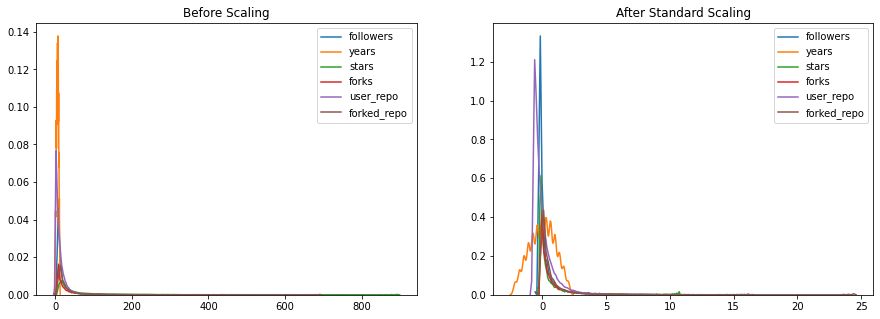

In [71]:
strans = scaler.fit_transform(X)

X_SS = pd.DataFrame(strans)
X_SS.columns = X.columns

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15, 5))
ax1.set_title('Before Scaling')
for e in X.columns:
    sns.kdeplot(X[e], ax=ax1, legend=True)
ax2.set_title('After Standard Scaling')
for e in X_SS.columns:
    sns.kdeplot(X_SS[e], ax=ax2, legend=True)
plt.show()

In [130]:
X_SS["label"] = X.label

X_scaled = X_SS.groupby("label").agg({"followers":"mean", "years":"mean", "stars":"mean", "forks":"mean", "user_repo":"mean", "forked_repo":"mean"}).reset_index()
X_scaled

,label,followers,years,stars,forks,user_repo,forked_repo
0,0.0,0.018868,-0.010474,0.012939,0.007174,0.031480,0.012553
1,1.0,0.000625,0.000763,-0.000245,0.000407,0.001468,-0.001234
2,2.0,0.106458,0.091016,0.015719,0.024302,0.023061,-0.026640
3,3.0,-0.080757,0.024129,0.006162,-0.023378,-0.045459,0.012503
4,4.0,-0.112160,0.028036,-0.022761,0.013040,-0.097084,0.170904


In [135]:
categories = list(X_scaled)[1:]

fig = go.Figure()

for v in X_scaled.values:
    fig.add_trace(go.Scatterpolar(
    r=v[1:],
    theta=categories,
    fill="toself",
    name=str(v[0]),
    text=str(v[0]),
    opacity=1,
    marker=dict(size=10)
    ))
    
fig.update_layout(polar=dict(radialaxis=dict(visible=True, range=[-.2, .2])), showlegend=True)

fig.show()

<img src='../OUTPUT/kmeans_reduction_scaled_radar.png'/>

#### Now as we see years has been taken into account as an important variable, but on the other side, other variables like stars have lost some importance. So which graph should we use? From my point of view both, the 1st one shows you the real data (however showing a varaible like years next to higher scaled ones doesn't have sense as we saw) and this one compares each label by each variable, so is easily to identify tendencies as;
    - Users with a lot of forked repos tend to have less followers
    - Having more original repos doesn't mean more followers
    - However stars, forks and followers seems to be related

#### Now, as we said at the beginning of the notebook we will use the PCA & t-SNE reduction methods to plot the labeled dataset in a 3d dimensions plot

#### Before impletementing the dimensionality reduction lets check the dimensions

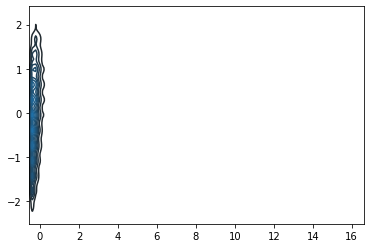

In [72]:
sns.kdeplot(X_SS)

#### Seems to be more than 3 

In [73]:
X_SS.shape

(39088, 6)

#### 6 dimensions actually

### PCA -- Choosing number of components

In [74]:
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(X_SS)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [75]:
pca.explained_variance_ratio_

array([0.43478514, 0.18059568, 0.1480659 , 0.11194439, 0.08866076,
       0.03594813])

Text(0, 0.5, 'Cummulative Explained Variance')

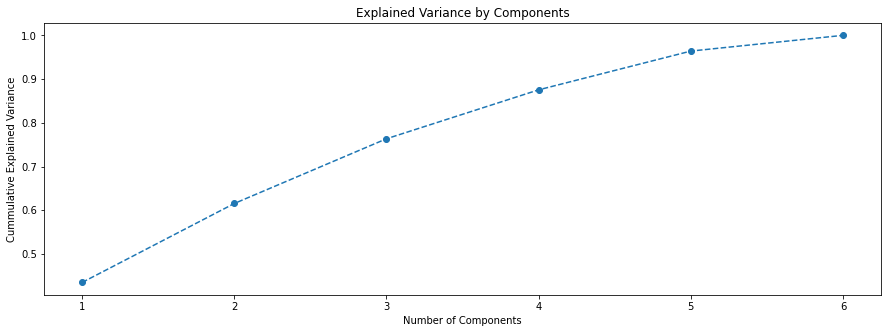

In [76]:
plt.figure(figsize=(15,5)) 
plt.plot(range(1,7), pca.explained_variance_ratio_.cumsum(), marker="o", linestyle="--")
plt.title("Explained Variance by Components")
plt.xlabel("Number of Components")
plt.ylabel("Cummulative Explained Variance")

#### The graph shows the amount of variance captured (on the y-axis) depending on the number of components we include (the x-axis). A rule of thumb is to preserve around 80 % of the variance. So, in this instance, we decide to keep 3 components.

In [77]:
pca = PCA(n_components=3).fit(X_SS)
X_3d = pca.transform(X_SS)

In [78]:
X_3d.shape

(39088, 3)

In [79]:
pca.components_

array([[ 0.47199012,  0.25024701,  0.51516075,  0.52018003,  0.33172978,
         0.26187641],
       [-0.08550274,  0.25438871, -0.36374205, -0.32960747,  0.47555298,
         0.67887824],
       [-0.02824546, -0.91811374,  0.06980074,  0.09339154,  0.32178733,
         0.19780836]])

In [80]:
pca.explained_variance_ratio_

array([0.43478514, 0.18059568, 0.1480659 ])

In [93]:
X["label"] = labels_pca

X_kmeans_pca = pd.concat([X, pd.DataFrame(X_3d).rename(columns={0:"Component1", 1:"Component2", 2:"Component3"})], axis=1)

X_kmeans_pca.dropna(how="any", inplace=True)
print(X_kmeans_pca.shape)
X_kmeans_pca.head()

(41300, 10)


,followers,years,stars,forks,user_repo,forked_repo,label,Component1,Component2,Component3
0,1.0,6.0,0.0,0.0,2.0,0.0,1.0,-0.868811,-0.305111,-0.270001
1,2.0,3.0,0.0,2.0,18.0,0.0,1.0,-0.736320,-0.115506,1.016647
2,14.0,7.0,7.0,2.0,28.0,15.0,1.0,0.209269,0.835988,0.048570
3,1.0,3.0,0.0,0.0,3.0,13.0,1.0,-0.985599,-0.222310,0.797153
4,3.0,8.0,22.0,6.0,3.0,13.0,1.0,-0.259500,0.038157,-0.755213


### 3D Graphs
I ll do it in matplotlib and interactive in plotly to have both versions

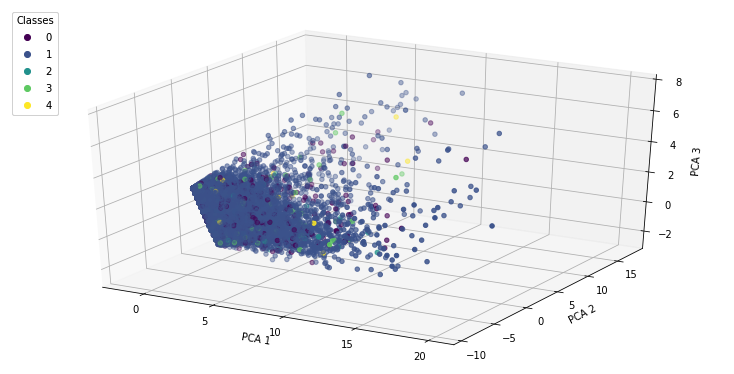

In [169]:
x = X_kmeans_pca.Component1
y = X_kmeans_pca.Component2
z = X_kmeans_pca.Component3

fig = plt.figure(figsize=(10,5))
ax = Axes3D(fig)

scatter = ax.scatter(x, y, z, c=X_kmeans_pca.label)

legend = ax.legend(*scatter.legend_elements(), loc="upper left", title="Classes")

ax.add_artist(legend)

ax.set_xlabel('PCA 1')
ax.set_ylabel('PCA 2')
ax.set_zlabel('PCA 3')
plt.show()

In [166]:
clust_cpa = X_kmeans_pca.iloc[:,6:]

In [168]:
cont = []
for i in range(7):
    fig = go.Scatter3d(x=clust_cpa.Component1[clust_cpa.label==i],
                        y=clust_cpa.Component2[clust_cpa.label==i],
                        z=clust_cpa.Component3[clust_cpa.label==i],
                        marker=dict(opacity=0.9,
                                    reversescale=True,
                                    colorscale='Blues',
                                    size=5),
                        line=dict (width=0.02),
                        mode='markers')

    cont.append(fig)    
    
#Make Plot.ly Layout
mylayout = go.Layout(scene=dict(xaxis=dict( title="PCA1"),
                                yaxis=dict( title="PCA2"),
                                zaxis=dict(title="PCA3")),)

#Plot and save html

py.iplot({"data": cont,
                     "layout": mylayout},
                     filename=("3DPlot.html"))

<img src='../OUTPUT/kmeans_reduction_pca.png'/>

### t-SNE

In [148]:
labels_tsne = X_kmeans.label
X = X_kmeans.drop(columns={"label"})

In [175]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=3, perplexity=50)

X_tsne = tsne.fit_transform(X)

In [176]:
X_kmeans_tsne = pd.concat([X, pd.DataFrame(X_tsne).rename(columns={0:"tsne1", 1:"tsne2", 2:"tsne3"}), labels_tsne], axis=1)
X_kmeans_tsne.dropna(how="any")
X_kmeans_tsne.head()

,followers,years,stars,forks,user_repo,forked_repo,tsne1,tsne2,tsne3,label
0,1.0,6.0,0.0,0.0,2.0,0.0,-20.983963,2.820386,-1.196878,1.0
1,2.0,3.0,0.0,2.0,18.0,0.0,-1.915720,-8.423464,-16.116913,1.0
2,14.0,7.0,7.0,2.0,28.0,15.0,8.487602,-9.262864,-6.138327,1.0
3,1.0,3.0,0.0,0.0,3.0,13.0,-2.853729,-16.108496,5.778910,1.0
4,3.0,8.0,22.0,6.0,3.0,13.0,5.171924,-3.012281,3.000372,1.0


### 3D Graphs
I ll do it in matplotlib and interactive in plotly to have both versions

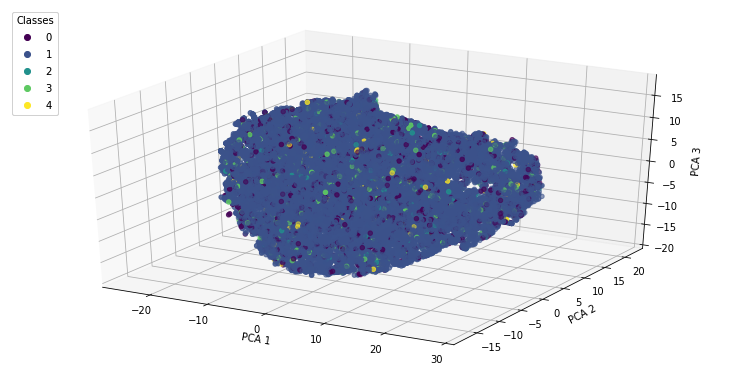

In [177]:
x = X_kmeans_tsne.tsne1
y = X_kmeans_tsne.tsne2
z = X_kmeans_tsne.tsne3

fig = plt.figure(figsize=(10,5))
ax = Axes3D(fig)

scatter = ax.scatter(x, y, z, c=X_kmeans_tsne.label)

legend = ax.legend(*scatter.legend_elements(), loc="upper left", title="Classes")

ax.add_artist(legend)

ax.set_xlabel('PCA 1')
ax.set_ylabel('PCA 2')
ax.set_zlabel('PCA 3')
plt.show()

In [158]:
clust_tsne = X_kmeans_tsne.iloc[:,6:]

In [178]:
cont = []
for i in range(7):
    fig = go.Scatter3d(x=clust.tsne1[clust.label==i],
                        y=clust.tsne2[clust.label==i],
                        z=clust.tsne3[clust.label==i],
                        marker=dict(opacity=0.9,
                                    reversescale=True,
                                    colorscale='Blues',
                                    size=5),
                        line=dict (width=0.02),
                        mode='markers')

    cont.append(fig)    
    
#Make Plot.ly Layout
mylayout = go.Layout(scene=dict(xaxis=dict( title="PCA1"),
                                yaxis=dict( title="PCA2"),
                                zaxis=dict(title="PCA3")),)

#Plot and save html

py.iplot({"data": cont,
                     "layout": mylayout},
                     filename=("3DPlot.html"))

<img src='../OUTPUT/kmeans_reduction_tsne.png'/>

### Conclusions from PCA & t-SNE graphs:
    - Applying any of them in this dataset after K Means doesn't have a real effect
    - PCA looks a bit clear than t-SNE to this dataset
    - The interactive graph is much more recommended for these type of representations